# Network Science
## Project: Social Network Analysis (VK)

* Student: meziane yazag
* Program: Data Science

The source of network is vk and I used vk_api python module https://pypi.org/project/vk-api/ to load the data from vk. I used vk account of a friend of mine. This is link to the account used https://vk.com/domadru

# Collect data from VK

In [9]:
!pip install vk_api
import vk_api

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.6/48.6 kB 3.1 MB/s eta 0:00:00


In [2]:
def auth_handler():
    """ Function for accounts with two factor authentication 
    """

    # Two factor authentication code
    key = input("Enter authentication code: ")
    remember_device = True

    return key, remember_device

In [3]:

email = '+79661658986'
password = 'Yourmomgaylol123'
vk_session = vk_api.VkApi(email, password, auth_handler=auth_handler)
vk_session.auth()

vk = vk_session.get_api()

Collecting my friends list

In [4]:
def get_friends_list(user_id=None,
                    fields_to_return=['sex', 'country','education','city', 'bdate']):
  
    """
    Gets friends list with specific fields, removes deleted pages 
    and selects and changes only important fields to make more readable
    dictionaries of information of every friend

    Parameters
    ----------
      user_id: int

      fields_to_return: list of strs
        Profile fields to return. 
        Sample values: nickname, domain, sex, bdate, city, country, timezone, 
        photo_50, photo_100, photo_200_orig, has_mobile, contacts, education, 
        online, relation, last_seen, status, can_write_private_message, 
        can_see_all_posts, can_post, universities. 

    Returns
    -------
      list of dicts of information about friends
    """

    #collect friends list
    raw_list = vk.friends.get(user_id=user_id, fields=fields_to_return)
    
    #friends list preparation
    friends_list = []

    for friend in raw_list['items']:
      if friend.get('deactivated') != 'deleted':
        friend_new = {}

        if friend['sex'] == 1:
          sex = 'ж'
        else:
          sex = 'м'

        bdate = friend.get('bdate', '')
        if len(bdate) > 6:
          byear = bdate[len(bdate)-4:]
        else:
          byear = ''

        friend_new.update({'name' : friend['first_name'] + ' ' + friend['last_name'],
                           'name_label': friend['first_name'] + '\n' + friend['last_name'],
                           'sex': sex, 
                           'byear': byear,
                           'id' : friend['id'],
                           'city': friend.get('city', {}).get('title', ''),
                           'country': friend.get('country', {}).get('title', ''),
                           'faculty_name': friend.get('faculty_name', ''), 
                           'university_name': friend.get('university_name', '')
                           })
        friends_list.append(friend_new)
      
    return friends_list

In [5]:
my_friends_list = get_friends_list()
my_friends_names = [friend['name'] for friend in my_friends_list]
my_friends_list[7]

{'name': 'Арина Безбородова',
 'name_label': 'Арина\nБезбородова',
 'sex': 'ж',
 'byear': '2000',
 'id': 54892634,
 'city': 'Москва',
 'country': 'Россiя',
 'faculty_name': '',
 'university_name': 'НИУ ВШЭ (ГУ-ВШЭ)'}

Finging friends connections to make edges for our graph and save file with these edges

In [6]:
from google.colab import files

#collect friends of friends
def save_friends_edges(main_friends_list):
    """
    Collects friends of friends of main user, makes edges for graph of friends 
    connections, find number of mutual friends to set edges attributes, 
    save these edges and edges attributes to .txt files, find number of friends
    and update main_friends_list to make new node attribute

    Start this function only if you're not already have file with edges

    Parameters
    ----------
      main_friends_list: list of dicts
        list of dicts of information about friends

    Returns
    -------
      saves files with edges and edges attributes
    """
    friends_connections = [] # list of tuples
    main_friends_ids = [friend['id'] for friend in main_friends_list]
    list_num_mutfr = [] # for edge attributes 
    main_friends_list_new = [] #with new attribute number of friends

    for friend in main_friends_list:
      this_friend_friends = get_friends_list(user_id=friend['id'])
      for friend_friend in this_friend_friends:
        edge = tuple(sorted([friend['name'], friend_friend['name']]))
        if (friend_friend['id'] in main_friends_ids and 
            edge not in friends_connections and 
            friend_friend['name'] != 'Ира\nЮрьева'):
          friends_connections.append(edge)
          list_num_mutfr.append(len(vk.friends.getMutual(source_uid=friend['id'],
                                                         target_uid=friend_friend['id'])))
      friend.update({'n_friends': len(this_friend_friends)})
      main_friends_list_new.append(friend)
    
    main_friends_list = main_friends_list_new

    with open('friends_edges.txt', 'w') as f:
        f.write('\n'.join('%s %s' % x for x in friends_connections))

    with open('friends_edges_attributes.txt', 'w') as f:
        f.write('\n'.join('%s' % x for x in list_num_mutfr))

In [7]:
file_with_edges = True #change to True if you already have files 

if not file_with_edges:
  save_friends_edges(my_friends_list)

In [8]:
my_friends_list[19]

{'name': 'Полина Гришай',
 'name_label': 'Полина\nГришай',
 'sex': 'ж',
 'byear': '2002',
 'id': 109554765,
 'city': 'Уфа',
 'country': 'Россiя',
 'faculty_name': 'Факультет мировой экономики и мировой политики',
 'university_name': 'НИУ ВШЭ (ГУ-ВШЭ)'}

In [9]:
import pandas as pd

In [10]:
df = pd.DataFrame(data=my_friends_list)

In [11]:
df

,name,name_label,sex,byear,id,city,country,faculty_name,university_name
0,Виталiй Сочновъ,Виталiй\nСочновъ,м,1988,2607717,Москва,Россiя,,
1,Алексѣй Мячинъ,Алексѣй\nМячинъ,м,,3475116,Москва,Россiя,Факультет экономических наук,НИУ ВШЭ (ГУ-ВШЭ)
2,Анна Гринюкъ,Анна\nГринюкъ,ж,1996,23179446,Домодедово,Россiя,Институт международных отношений и социально-п...,МГЛУ (бывш. МГПИИЯ им. Мориса Тореза)
3,Александръ Жирковъ,Александръ\nЖирковъ,м,,28211758,Москва,Россiя,Факультет экономических наук,НИУ ВШЭ (ГУ-ВШЭ)
4,Екатерина Обухова,Екатерина\nОбухова,ж,,39348224,Москва,Россiя,Естественно-технологический институт,МГТУ\r\n
...,...,...,...,...,...,...,...,...,...
170,Selen Makhmudova,Selen\nMakhmudova,ж,2001,691780835,,,,
171,Abel Fajri,Abel\nFajri,м,,708151011,,,,
172,Арина Варнавская,Арина\nВарнавская,ж,2002,708156440,,,,
173,Ulugbek Khoshimov,Ulugbek\nKhoshimov,м,2001,745999340,Москва,Россiя,,НОУ МТИ


Open file

In [12]:
with open('friends_edges.txt') as f:
  raw_edges = f.readlines()

with open('friends_edges_attributes.txt') as f:
  edges_attrs = f.readlines()

In [13]:
edges = []

for r_edge in raw_edges:
  line = r_edge.split(' ')
  edge = (line[0] + ' ' + line[1], line[2] + ' ' + line[3][:len(line[3])-1])
  edges.append(edge)

edges_attrs = [int(attr) for attr in edges_attrs]

In [14]:
edges[:22]

[('Виталiй Сочновъ', 'Татьяна Смитъ'),
 ('Murad Sadygzade', 'Виталiй Сочновъ'),
 ('Виталiй Сочновъ', 'Екатерина Потемкина'),
 ('Виталiй Сочновъ', 'Малика Аббасханова'),
 ('Emilio Villaseñor', 'Виталiй Сочновъ'),
 ('Zainab Hasan', 'Виталiй Сочновъ'),
 ('Алексѣй Мячинъ', 'Катя Сухарева'),
 ('Алексѣй Мячинъ', 'Саша Петрова'),
 ('Алексѣй Мячинъ', 'Андрей Габриэль'),
 ('Алексѣй Мячинъ', 'Родiонъ Мкртычевъ'),
 ('Алексѣй Мячинъ', 'Сергѣй Медакинъ'),
 ('Алексѣй Мячинъ', 'Амаль Ганiевъ'),
 ('Cristina Comina', 'Алексѣй Мячинъ'),
 ('Алексѣй Мячинъ', 'Шахрiёръ Исмаилходжаевъ'),
 ('Акбаръ Аскаровъ', 'Алексѣй Мячинъ'),
 ('Daniel Suarez', 'Алексѣй Мячинъ'),
 ('Алексѣй Мячинъ', 'Гюльхаръ Байрамова'),
 ('Алексѣй Мячинъ', 'Владиславъ Коваленко'),
 ('Алексѣй Мячинъ', 'Бахтiёръ Асроровъ'),
 ('Алексѣй Мячинъ', 'Лiана Берсанова'),
 ('Murod Zarifov', 'Алексѣй Мячинъ'),
 ('Анна Гринюкъ', 'Михаилъ Рябовъ')]

Make graph of the resulting edges

In [15]:
import networkx as nx
     

edges_attributes = [{'mut_friends': num} for num in edges_attrs]
edges_attributes = zip(edges, edges_attributes)
edges_attributes = dict(edges_attributes)
     

friends_attributes = zip(my_friends_names, my_friends_list)
friends_attributes = dict(friends_attributes)
     

G = nx.Graph()
G.add_nodes_from(friends_attributes)
nx.set_node_attributes(G, friends_attributes)
G.add_edges_from(edges)
nx.set_edge_attributes(G, edges_attributes)
list(G.nodes())[:31]

['Виталiй Сочновъ',
 'Алексѣй Мячинъ',
 'Анна Гринюкъ',
 'Александръ Жирковъ',
 'Екатерина Обухова',
 'Алексѣй Переясловъ',
 'Артёмъ Мальцевъ',
 'Арина Безбородова',
 'Евгенiй Стародубецъ',
 'Маша Якунина',
 'Алина Зубъ',
 'Михаилъ Рябовъ',
 'Анюта Гончарова',
 'Оля Стадникъ',
 'Никита Бойко',
 'Татьяна Смитъ',
 'Владимipъ Копыловъ',
 'Ahmad Al qana',
 'Julien Lusinchi',
 'Полина Гришай',
 'Даша Балацкая',
 'Таня Полянина',
 'Дарья Милякова',
 'Аида Гурбанова',
 'Викторiя Рыбкова',
 'Олегъ Рустамовъ',
 'Сергѣй Морозовъ',
 'Софико Меладзе',
 'Катя Сухарева',
 'Саша Петрова',
 'Ната Деметрашвили']

In [16]:
len(G.nodes())

202

In [17]:
G.nodes['Саша Петрова']

{'name': 'Саша Петрова',
 'name_label': 'Саша\nПетрова',
 'sex': 'ж',
 'byear': '1917',
 'id': 152209520,
 'city': 'Москва',
 'country': 'Россiя',
 'faculty_name': '',
 'university_name': 'НИУ ВШЭ (ГУ-ВШЭ)'}

In [18]:
nx.write_gexf(G, "friends_graph.gexf")

## Imports

In [19]:
import requests
import random
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import math
%matplotlib inline
import scipy.io
import scipy.stats
import seaborn as sns
import scipy.spatial as spt
from IPython.display import SVG
import pandas as pd
import matplotlib.image as mpimg
from typing import Dict, List
from networkx.algorithms import community
from sklearn.cluster import KMeans
from collections import Counter
import matplotlib.patches as mpatches
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform
from matplotlib.colors import ListedColormap
from matplotlib.cm import ScalarMappable
from scipy.stats import kstest
from sklearn.linear_model import LinearRegression
from sklearn.cluster import AgglomerativeClustering
from scipy.stats import spearmanr
from sklearn.metrics.pairwise import cosine_similarity
from scipy.sparse.csgraph import reverse_cuthill_mckee

In [20]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Read the (.gexf) file

In [21]:
G = nx.read_gexf('friends_graph.gexf').to_undirected()

## Your Network Summary

Tasks:

1.   Network source and preprocessing (whether API was used, removing redundant information, do not forget to remove yourself (!) from ego-network).
2.   Node/Edge attributes.
3.   Size, Order.
4.   Diameter, radius.
5.   Clustering Coefficient (global, average local, histogram of locals).
6.   Average path length (+histogram).
7.   Degree distribution, fitting models and coefficient from regression/MLE/KS-test.
8.   Gorgeous network layout.

# Network Summary


*   Network source and the description of preprocessing steps.
*   Type of the graph: directed/undirected, heterogeneous/homogeneous, weighted/unweighted, etc.

*   Node/Edge attributes.
*   Number of nodes and edges,Diameter, radius.

*   Clustering coefficient (global, average local, histogram).
*   Average path length (histogram).

*   Degree distribution, fitted models by regression/MLE/KS-test.
*   Gorgeous network layout. Try to show that your network has some structure, play with node sizes and colors, scaling parameters. Tools like Gephi may be useful here.









1. The information extracted from a (VK) profile (.gexf). The node itself is not in the file (After extracting gigantic componnet). Removing redundent information in the following

In [22]:
def delete_unnecessary_attrs(graph, *attrs):
    for node in graph.nodes:
        d_copy = list(graph.nodes[node])
        for key in d_copy:
            if key in attrs:
                del(graph.nodes[node][key])
    return graph

delete_unnecessary_attrs(G, 'nickname', 'photo_50', 'screen_name')

Extract Gigantic Component

In [23]:
cc = [len(c) for c in sorted(nx.connected_components(G), key=len, reverse=True)]
print('Connected Component Discription:')
print("")
for c in Counter(cc):
  print('{} connected components ({} elements)'.format(Counter(cc)[c], c))


def select_gygantic_component(g: nx.Graph) -> nx.Graph:
    node_list = sorted(nx.connected_components(g), key = len, reverse=True)
    gg = node_list[0]
    len(node_list)
    for i in range(len(node_list) - 1):
        g.remove_nodes_from(node_list[i+1])
    return g

gig_component = G.copy()
gig_component = select_gygantic_component(gig_component)

Connected Component Discription:

1 connected components (171 elements)
1 connected components (18 elements)
1 connected components (6 elements)
7 connected components (1 elements)


2. Node/edge attributes

In [24]:
def node_and_edge_attributes(graph):
    node_attrs = set([attr for node in graph.nodes for attr in graph.nodes[node].keys()])
    edge_attrs = set([attr for edge in graph.edges for attr in graph.edges[edge].keys()])
    print("Node attributes :", node_attrs)
    print("Edge attributes :", edge_attrs)
    
node_and_edge_attributes(G)

Node attributes : {'label', 'country', 'name_label', 'sex', 'city', 'name', 'university_name', 'faculty_name', 'byear'}
Edge attributes : {'mut_friends', 'id'}


Basic Statistics
3.  Size, Order
4.  Diameter, Radious

For calculating the diameter and radius of the graph it has to be connected. Since the graph is not connected ,we need the largest connected component of the graph and get its diameter and radius

In [25]:
print("Number of nodes:", len(G.nodes))
print("Number of edges:", len(G.edges))
print('Diameter: ', nx.diameter(gig_component))
print('Radius: ', nx.radius(gig_component))
print('Average shortest path length: ', nx.average_shortest_path_length(gig_component))
print('Average clustering coefficient: ', nx.average_clustering(gig_component))

Number of nodes: 202
Number of edges: 1286
Diameter:  6
Radius:  3
Average shortest path length:  2.7318197454420363
Average clustering coefficient:  0.5089631118722511


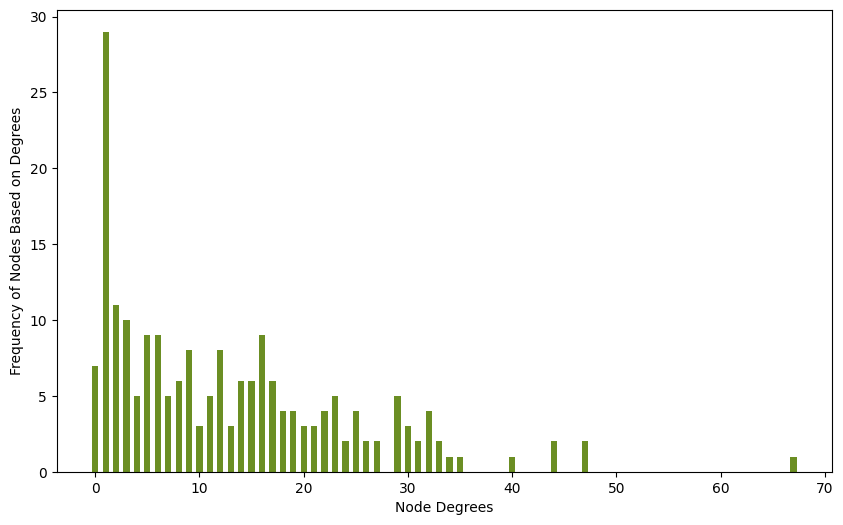

In [39]:
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)
degree_count = {}
for key in degree_sequence:
    if key not in degree_count:
        degree_count[key] = 1
    else:
        degree_count[key] += 1

node_degree, node_numbers = list(degree_count.values()), list(degree_count.keys())
plt.figure(figsize=(10, 6))
plt.bar(node_numbers, node_degree, color='olivedrab', width=0.6)
plt.xlabel("Node Degrees")
plt.ylabel("Frequency of Nodes Based on Degrees")
plt.show()

5. Clustering Coefficient (global, average local, histogram of locals).

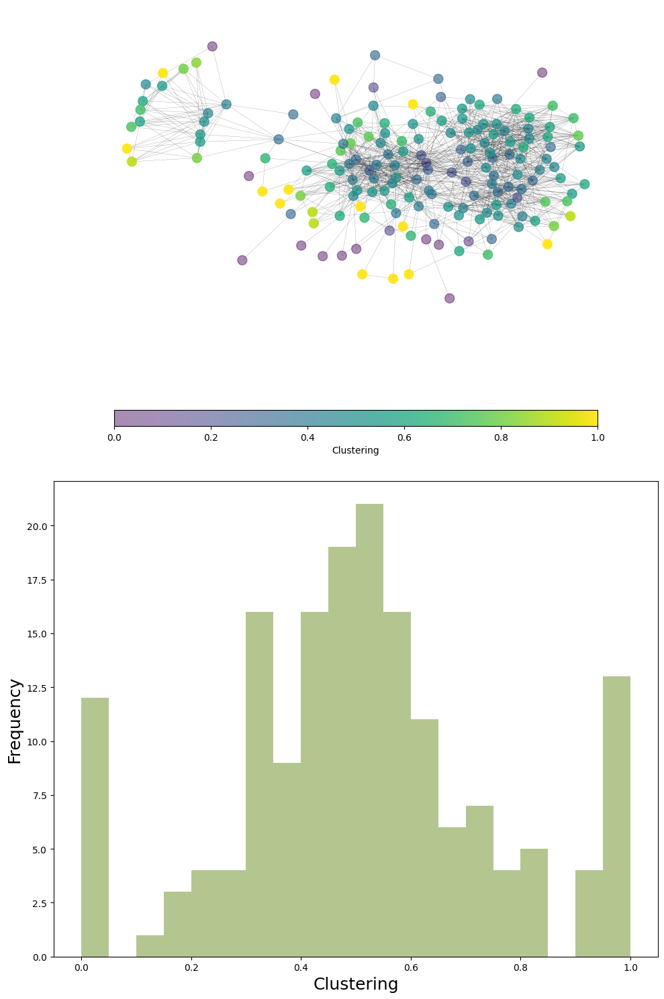

In [41]:
def customized_color(name_cmap, alpha):
  cmap = plt.get_cmap(name_cmap)
  custom_cmap = cmap(np.arange(cmap.N))
  custom_cmap[:,-1] = np.linspace(alpha, 1, cmap.N)
  custom_cmap = ListedColormap(custom_cmap)
  return custom_cmap

def pos_layout(g):
  df = pd.DataFrame(index=g.nodes(), columns=g.nodes())
  for row, data in nx.shortest_path_length(g):
      for col, dist in data.items():
          df.loc[row,col] = dist

  df = df.fillna(df.max().max())
  return df


cluster_coef = nx.clustering(gig_component)
cmap = customized_color('viridis', 0.45)
norm = plt.Normalize(0, max(cluster_coef.values()))
node_colors = [cmap(norm(cluster_coef[node])) for node in gig_component.nodes]
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(10, 15))

df = pos_layout(gig_component)

pos = nx.kamada_kawai_layout(gig_component, dist=df.to_dict())
nx.draw(gig_component, 
        node_color=node_colors, 
        ax=ax1,
        pos=pos, 
        node_size=100, 
        width=0.1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), 
             label='Clustering', 
             shrink=0.8, 
             ax=ax1,
             aspect=30,
             orientation="horizontal")
ax1.tick_params(labelsize=25) 

ax1.margins(0.1,0.1)
ax2.hist(cluster_coef.values(), bins=20,alpha=0.5, color='olivedrab')
ax2.set_xlabel('Clustering', fontsize=18)
ax2.set_ylabel('Frequency', fontsize=18)

plt.tight_layout()
plt.show()

6.   Average Path Length (+ histogram)

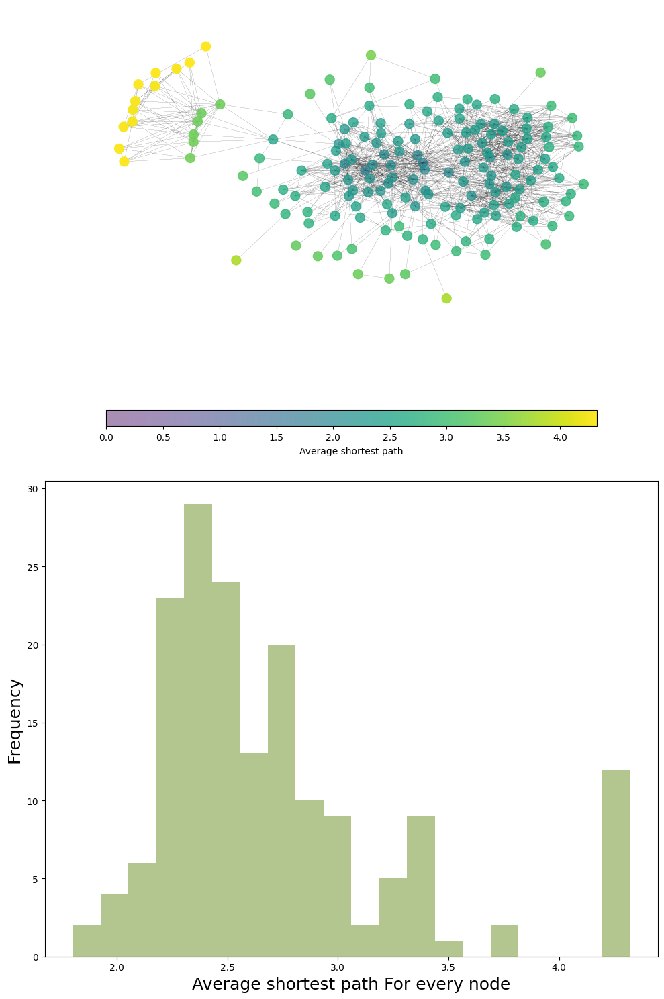

In [44]:
path_lens = {}
for node, path_len in nx.all_pairs_shortest_path_length(gig_component):
  path_means = np.mean(list(path_len.values()))
  path_lens[node] = path_means

cmap = customized_color('viridis', 0.45)

norm = plt.Normalize(0, max(path_lens.values()))
node_colors = [cmap(norm(path_lens[node])) for node in gig_component.nodes]
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(10, 15))

pos = nx.kamada_kawai_layout(gig_component, dist=df.to_dict())
nx.draw(gig_component, 
        node_color=node_colors, 
        ax=ax1,
        pos=pos, 
        node_size=100, 
        width=0.1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), 
             label='Average shortest path', 
             shrink=0.8, 
             ax=ax1,
             aspect=30,
             orientation="horizontal")
ax1.tick_params(labelsize=25) 

ax1.margins(0.1,0.1)
ax2.hist(path_lens.values(), bins=20,alpha=0.5, color='olivedrab')
ax2.set_xlabel('Average shortest path For every node', fontsize=18)
ax2.set_ylabel('Frequency', fontsize=18)

plt.tight_layout()
plt.show()

7.   Degree distribution, fitting models and coefficient from regression/MLE/KS-test.

In [46]:
degrees = [val for key, val in gig_component.degree()]
n = len(degrees)
deg_dist = pd.value_counts(degrees)
deg_dist.sort_index(inplace=True)
pdf = deg_dist/n
cdf = np.cumsum(pdf)

<ipython-input-47-73640b8e597e>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(deg_dist)


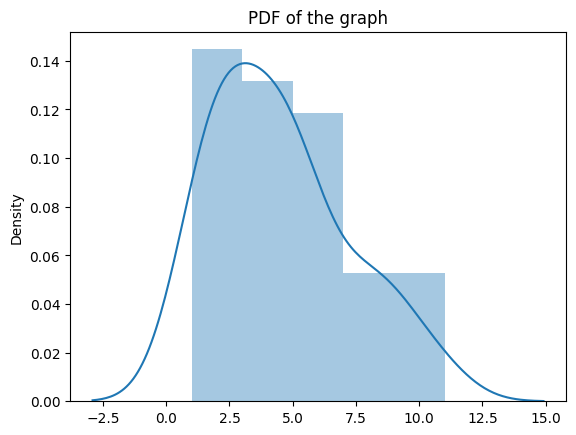

In [47]:
plt.title('PDF of the graph')
sns.distplot(deg_dist)
plt.show()

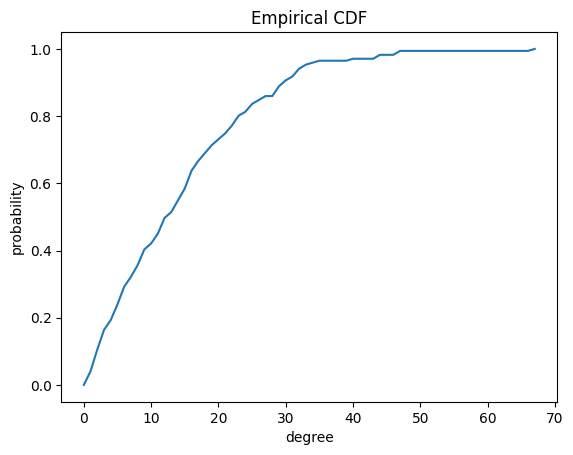

In [48]:
def empirical_cdf(g: nx.Graph) -> List[float]:
    deg = nx.degree_histogram(g)
    deg_cum = np.cumsum(deg)
    return deg_cum/deg_cum[-1]
ecdf = empirical_cdf(gig_component)
plt.plot(ecdf)
plt.xlabel('degree')
plt.ylabel('probability')
plt.title('Empirical CDF')
plt.show()

alternative display


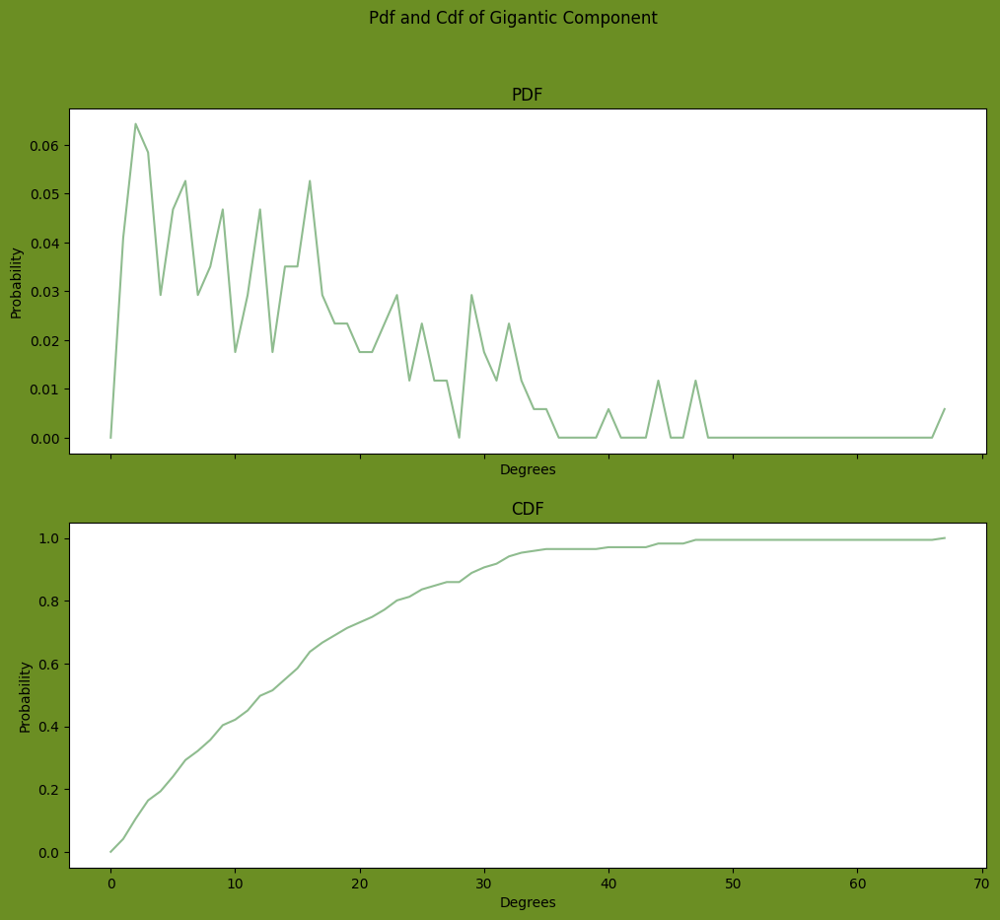

In [52]:
def gigantic_component_pdf(graph):
    return [deg_freq/len(graph.nodes) for deg_freq in nx.degree_histogram(graph)]

def gigantic_component_cdf(graph):
    pdfs = gigantic_component_pdf(graph)
    return np.cumsum(pdfs)

pdf = gigantic_component_pdf(gig_component)
cdf = gigantic_component_cdf(gig_component)

fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(12, 10), facecolor='olivedrab')
ax[0].plot(pdf, color='darkseagreen')
ax[0].set_title('PDF')
ax[0].set_xlabel('Degrees')
ax[0].set_ylabel('Probability')

ax[1].plot(cdf, color='darkseagreen')
ax[1].set_title('CDF')
ax[1].set_xlabel('Degrees')
ax[1].set_ylabel('Probability')
plt.suptitle("Pdf and Cdf of Gigantic Component")
plt.show()

Log Scale

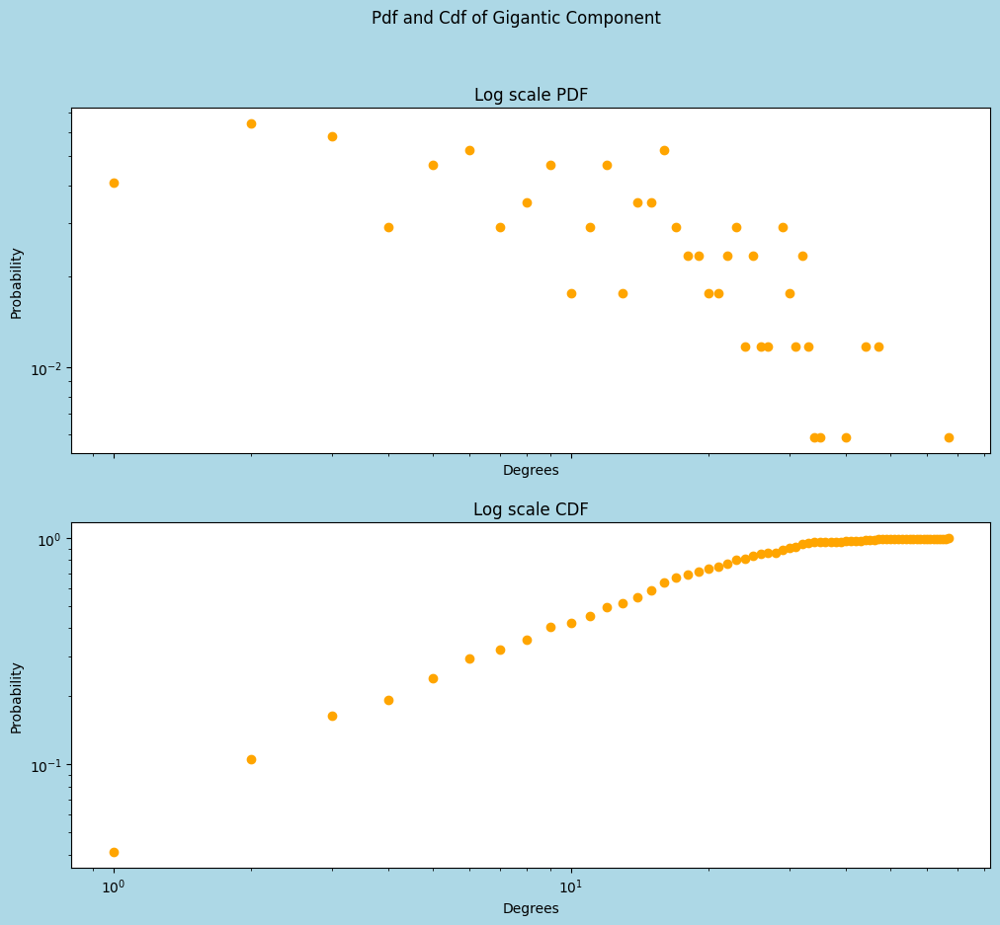

In [53]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(12, 10), facecolor='lightblue')
ax[0].loglog(np.arange(0, len(pdf)),
             pdf,
             color='orange',
             marker='o',
             linestyle='None')
ax[0].set_title('Log scale PDF')
ax[0].set_xlabel('Degrees')
ax[0].set_ylabel('Probability')

ax[1].loglog(np.arange(0, len(cdf)),
             cdf,
             color='orange',
             marker='o',
             linestyle='None')
ax[1].set_title('Log scale CDF')
ax[1].set_xlabel('Degrees')
ax[1].set_ylabel('Probability')
plt.suptitle("Pdf and Cdf of Gigantic Component")
plt.show()

In [54]:
def power_law_pdf(x, alpha=3.5, x_min=1):
    C = (alpha - 1) / x_min ** (1 - alpha)
    return C * x ** (-alpha)

def power_law_cdf(x, alpha=3.5, x_min=1):
    F_x = (x_min / x) ** (alpha-1)
    return 1 - F_x

def mle_power_law_params(degree_sequence):
    best_kstest = None
    sorted_x_train = np.sort(degree_sequence)
    x_mins = range(int(np.min(sorted_x_train)), int(np.max(sorted_x_train)))
    for i in range(len(x_mins)):
        x_min = x_mins[i]
        x_train = sorted_x_train[sorted_x_train >= x_min]
        alpha = 1 + len(x_train) * np.sum(np.log(x_train / x_min))**(-1)
        ks_test = kstest(x_train, lambda x:power_law_cdf(x, alpha, x_min))[0]
        
        if (best_kstest is None): # making sure it runs atleast once
            best_alpha, best_x_min, best_kstest = alpha, x_min, ks_test
        elif (best_kstest > ks_test):
            best_alpha, best_x_min, best_kstest = alpha, x_min, ks_test
      
    return best_alpha, best_x_min

def alpha_log_bins(x_train, bins):
    log_bins = np.logspace(np.log10(x_train.min()), np.log10(x_train.max()), bins)
    histogram = np.histogram(x_train, log_bins, density=True)
    density = histogram[0][np.where(histogram[0] != 0)]
    density = np.log(density / len(x_train))
    bin_centers = np.log((histogram[1][1:] + histogram[1][:-1]) / 2)
    bin_centers = bin_centers[np.where(histogram[0] != 0)].reshape(-1, 1)
    model = LinearRegression()
    model.fit(bin_centers, density)
    return abs(np.squeeze(model.coef_))

<Figure size 1200x1000 with 0 Axes>

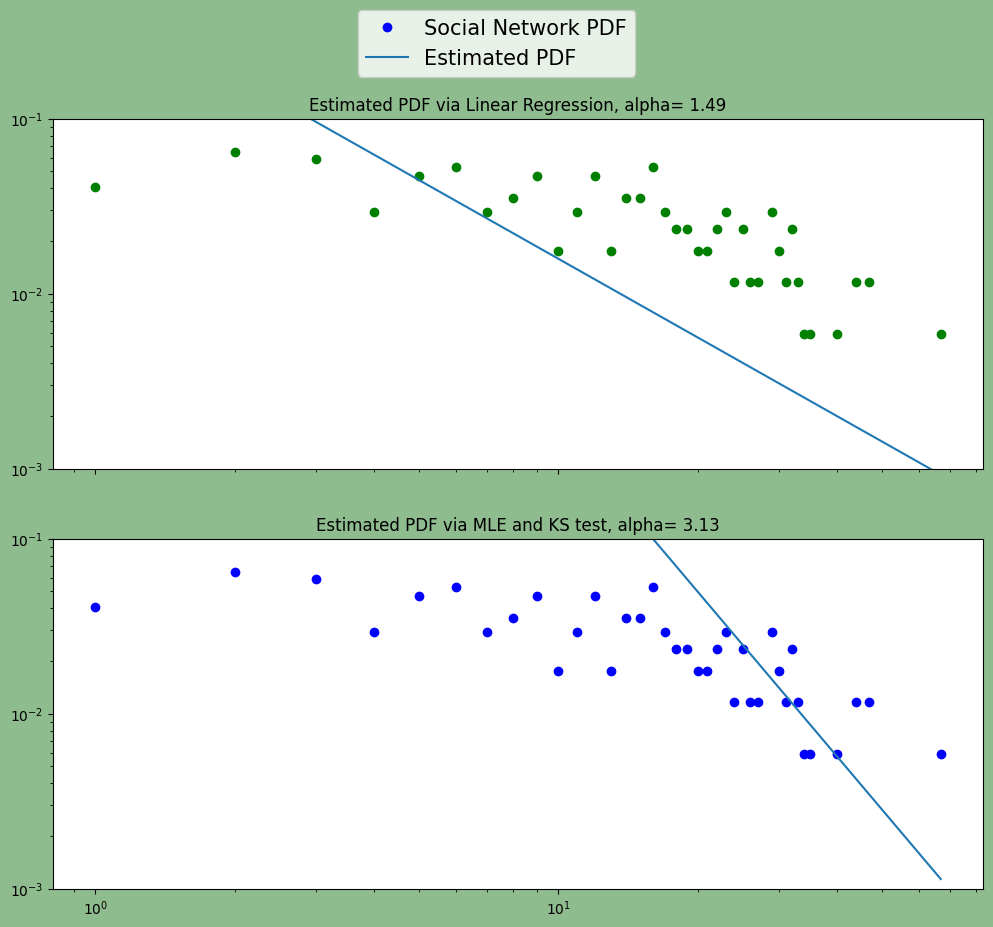

In [59]:
bins = 100
degree_sequence = np.array(list(dict(nx.degree(gig_component)).values()))
x_min = degree_sequence.min()

binning = np.logspace(np.log10(x_min), np.log10(degree_sequence.max()), bins)
hist, bin_edges = np.histogram(degree_sequence, bins=binning, density=True)
bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
x_space = np.linspace(x_min, degree_sequence.max(), 100)


plt.figure(figsize=(12, 10))   
plt.rcParams['axes.grid'] = False
fig, (ax1, ax2) = plt.subplots(2,1, sharex=True, figsize=(12, 10), facecolor='darkseagreen')


ax1.loglog(np.arange(0, len(pdf)), 
           pdf, 
           color='green', 
           marker='o', 
           linestyle='None',
           label='Social Network PDF')
hat_alpha_reg = alpha_log_bins(degree_sequence, bins)
ax1.loglog(x_space, power_law_pdf(x_space, hat_alpha_reg, x_min), 
         label='Estimated PDF', c='tab:blue')
ax1.set_title('Estimated PDF via Linear Regression, alpha= {:.2f}'.format(hat_alpha_reg))
ax1.set_ylim(0.001, 0.1)
        
ax2.loglog(np.arange(0, len(pdf)), 
           pdf, 
           color='blue', 
           marker='o', 
           linestyle='None',
           label='Social Network PDF')
hat_alpha, hat_x_min = mle_power_law_params(degree_sequence)
ax2.loglog(x_space, power_law_pdf(x_space, hat_alpha, hat_x_min), 
         label='Estimated PDF', c='tab:blue')
ax2.set_title('Estimated PDF via MLE and KS test, alpha= {:.2f}'.format(hat_alpha))
ax2.set_ylim(0.001, 0.1)
handles, labels = ax2.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', prop={'size': 15})

plt.show()

8.   Gorgeous network layout.

<ipython-input-61-3410426daae2>:23: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(ScalarMappable(cmap=cmap, norm=norm),


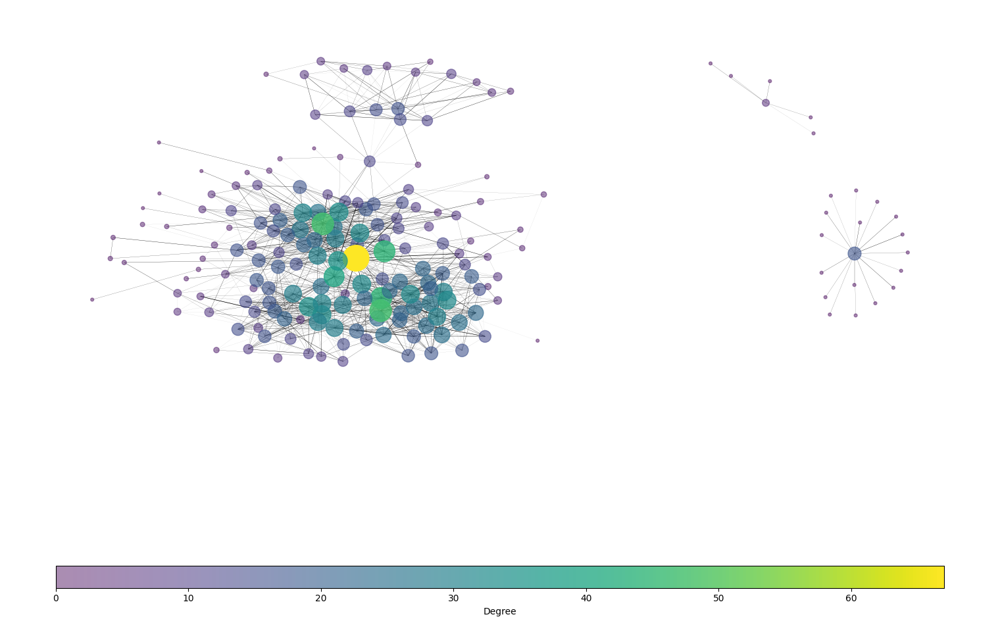

In [61]:
node_degree = nx.degree(G)
norm = plt.Normalize(0, max(dict(node_degree).values()))
cmap = customized_color('viridis', 0.45)
node_colors = [cmap(norm(dict(node_degree)[node])) for node in G.nodes]

elem = list(G.degree)
node_sizes, edge_width_list = [], []
for e in elem:
  edge_width_list.append(e[1])
  node_sizes.append(e[1] * 12)

edge_width = ((edge_width_list/np.max(edge_width_list))/2) + 0.02


plt.figure(figsize=(15, 10))
df_g = pos_layout(G)
pos = nx.kamada_kawai_layout(G, dist=df_g.to_dict())
nx.draw(G, 
        node_color=node_colors, 
        pos=pos, 
        node_size=node_sizes,
        width=edge_width)
plt.colorbar(ScalarMappable(cmap=cmap, norm=norm), 
             label='Degree', 
             shrink=0.9,
             aspect=40,
             orientation="horizontal")
plt.show()

In [90]:
sex_info = Counter(nx.get_node_attributes(G,'sex').values()).most_common()
print('Number of friends divided by gender:')
print('Male:', sex_info[0][1])
print('Female:',sex_info[1][1])

print("")

node_sex = nx.get_node_attributes(G,'sex') 
node_colors = []
for node in G.nodes:
  if node_sex[node] == 1 and node:
    node_colors.append('orange')
  elif node_sex[node] == 0:
    node_colors.append('red')
  else:
    node_colors.append('green')

plt.figure(figsize=(15, 10))
df_g = pos_layout(G)
pos = nx.kamada_kawai_layout(G, dist=df_g.to_dict())
nx.draw(G, 
        node_color=node_colors,
        pos=pos, 
        node_size=node_sizes,
        width=0.1)
purple_patch = mpatches.Patch(color='green', label='Male - '+str(sex_info[0][1]))
yellow_patch = mpatches.Patch(color='orange', label='Female - '+str(sex_info[1][1]))
red_patch = mpatches.Patch(color='red', label='Not Defined - '+str(sex_info[2][1]))

plt.legend(handles=[purple_patch, yellow_patch, red_patch], fontsize=20, loc='upper left')

plt.show()

Number of friends divided by gender:
Male: 102
Female: 73



KeyError: ignored

# Structural Analysis



*   The closest random graph model similar to your social network. Compare models from lectures, such as ER, BA, WS. Check real-world network properties on chosen random graph models and your network, compare the results.
*   Degree/Closeness/Betweenness/Katz/Eigenvector centralities, top nodes description.

*   Page-Rank/HITS in a case of directed network, top nodes description.
*   Correlation comparison of centralities.

*   Assortative mixing by node attributes and node degree.
*   Node structural equivalence/similarity.







The closest random graph model similar to your social network. Compare models from lectures, such as ER, BA, WS. Check real-world network properties on chosen random graph models and your network, compare the results.

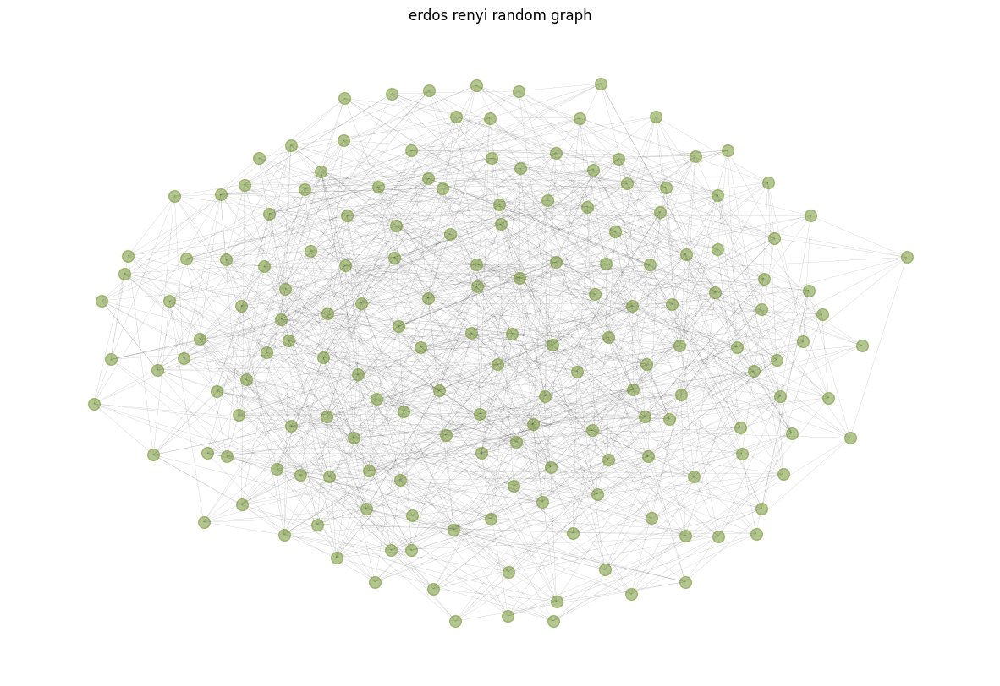

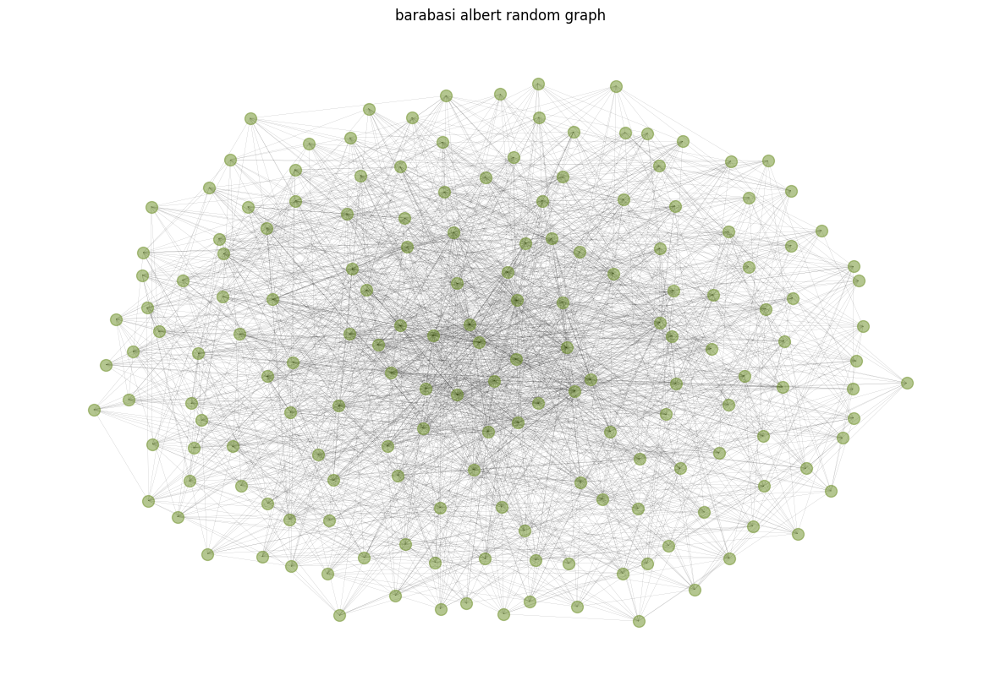

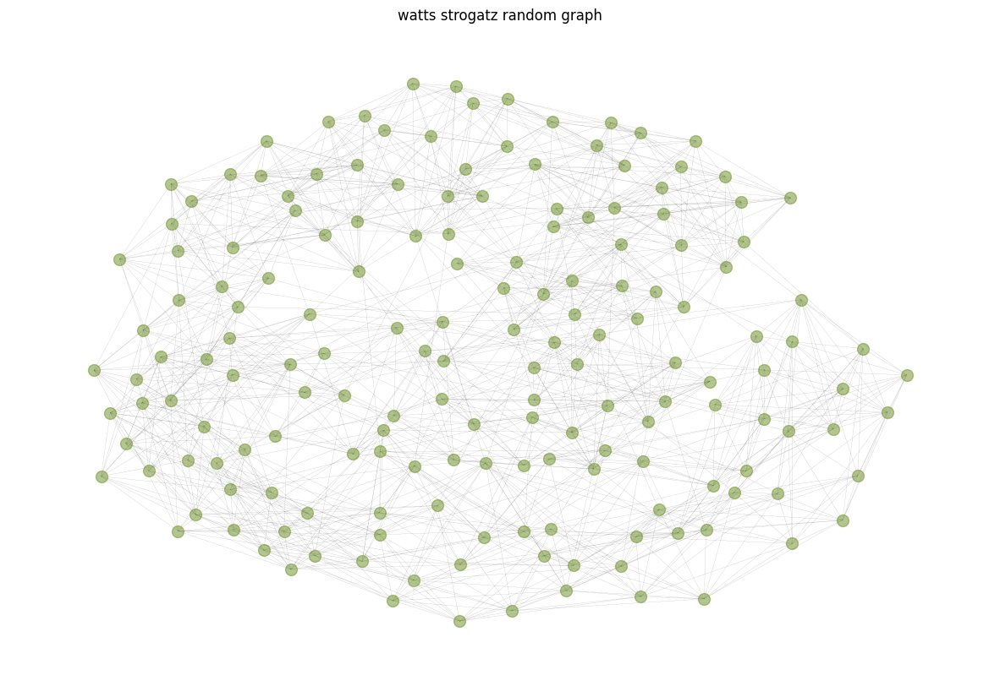

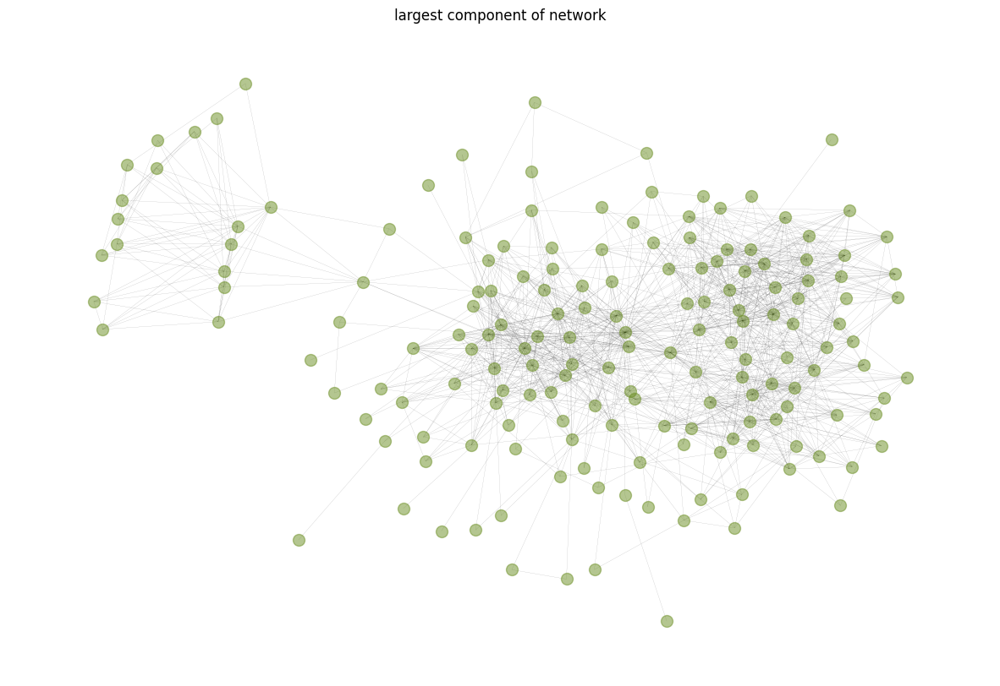

In [92]:
n_nodes = len(gig_component.nodes())
avg_edges = np.array([d for n, d in gig_component.degree()]).mean()
prob = avg_edges/n_nodes

# Erdos Reny
er_g = nx.fast_gnp_random_graph(n_nodes, prob, seed=1)

# Barbasi Albert
ba_g = nx.barabasi_albert_graph(n_nodes, int(avg_edges), seed=1)

# Watts-Strogatz
ws_g = nx.watts_strogatz_graph(n_nodes, int(avg_edges), p=0.1, seed=1)

rgs = {'erdos renyi random graph': er_g,
       'barabasi albert random graph':ba_g,
       'watts strogatz random graph':ws_g,
       'largest component of network': gig_component}

def customized_color(name_cmap, alpha):
  cmap = plt.get_cmap(name_cmap)
  custom_cmap = cmap(np.arange(cmap.N))
  custom_cmap[:,-1] = np.linspace(alpha, 1, cmap.N)
  custom_cmap = ListedColormap(custom_cmap)
  return custom_cmap

def pos_layout(g):
  df = pd.DataFrame(index=g.nodes(), columns=g.nodes())
  for row, data in nx.shortest_path_length(g):
      for col, dist in data.items():
          df.loc[row,col] = dist

  df = df.fillna(df.max().max())
  return df

for rg_title, rg in rgs.items():
    df = pos_layout(rg)
    pos = nx.kamada_kawai_layout(rg, dist=df.to_dict())
    plt.figure(figsize=(15, 10))
    plt.title(rg_title)
    nx.draw(rg, 
            pos=pos,
            width=0.1,
            node_color='olivedrab',
            node_size=100,
            alpha=0.5)
    plt.show()

In [93]:
def graph_properties(g):
  diameter = nx.diameter(g)
  radius = nx.radius(g)
  avg_path = nx.average_shortest_path_length(g)
  clustering = nx.average_clustering(g)
  return {'diameter': diameter,
          'radius': radius,
          'avg shortest path': avg_path,
          'avg clustering': clustering}

def get_gk(expected, actual, sigma): 
  return {k: (math.exp(-(expected[k]-actual[k])**2/(2*sigma[k]**2))) for k in actual}

In [94]:
sigma = {'diameter': 3,
          'radius': 1,
          'avg shortest path': 1,
          'avg clustering': 0.001}

gig_component_prop = graph_properties(rgs['largest component of network'])
gk_dict = {}
rg_prop_dict = {}

for rg_title, rg in rgs.items():
  rg_prop = graph_properties(rg)
  gk = get_gk(gig_component_prop, rg_prop, sigma)
  rg_prop_dict[rg_title] = rg_prop 
  gk_dict[rg_title] = gk

df1 = pd.DataFrame().from_dict(rg_prop_dict)
df1['sigma'] = pd.Series(sigma)

df2 = pd.DataFrame().from_dict(gk_dict)
df2 = df2.transpose()
df2['Total Score'] = df2.sum(axis=1)/4
display(df1.transpose())
print('')
display(df2)
     

,diameter,radius,avg shortest path,avg clustering
erdos renyi random graph,3.0,3.0,2.186584,0.088373
barabasi albert random graph,3.0,2.0,1.878500,0.237816
watts strogatz random graph,5.0,3.0,2.704506,0.532181
largest component of network,6.0,3.0,2.731820,0.508963
sigma,3.0,1.0,1.000000,0.001000


,diameter,radius,avg shortest path,avg clustering,Total Score
erdos renyi random graph,0.606531,1.000000,0.861879,0.000000e+00,0.617102
barabasi albert random graph,0.606531,0.606531,0.694838,0.000000e+00,0.476975
watts strogatz random graph,0.945959,1.000000,0.999627,8.804528e-118,0.736397
largest component of network,1.000000,1.000000,1.000000,1.000000e+00,1.000000


Degree/Closeness/Betweenness/Katz/Eigenvector centralities, top nodes description.

In [95]:
def centralities(G: nx.Graph):
    central = {}
    central['degree'] = np.array(list(nx.degree_centrality(G).values()))
    central['closeness'] = np.array(list(nx.closeness_centrality(G).values()))
    central['betweenness'] = np.array(list(nx.betweenness_centrality(G).values()))
    return central

def top10_centralities(G: nx.Graph):
    top10_centralities_dict = {}
    for i, j in zip(['degree', 'closeness', 'betweenness'], [nx.degree_centrality, nx.closeness_centrality, nx.betweenness_centrality]):            
        top10_deg_cent = sorted(j(G).items(), key=lambda x: x[1], reverse=True)[:10]
        ids, centrality = zip(*top10_deg_cent)
        sex = [G.nodes[id]['sex'] for id in ids]
        names = [G.nodes[id]['label'] for id in ids]
        top10_centralities_dict[i] = pd.DataFrame({'id': ids,'name':names , 'sex':sex, 'centrality': centrality})
    return top10_centralities_dict

c = centralities(G)
top_dfs = top10_centralities(G)
top_dfs

{'degree':           id                name sex  centrality
 0  384121552     Акбаръ Аскаровъ   м    0.333333
 1  389679990  Гюльхаръ Байрамова   ж    0.233831
 2  458727779      Бернардъ Баако   м    0.233831
 3  157632253     Андрей Габриэль   м    0.218905
 4  559493650  Ботуръ Нажмидиновъ   м    0.218905
 5  388859317       Daniel Suarez   м    0.199005
 6  511066171   Barbara Majdakova   ж    0.174129
 7  561252362          Ian Dalmau   м    0.169154
 8  286802151  Миранъ Мирзохидовъ   м    0.164179
 9  583298409     Кадыровъ Самиръ   м    0.164179,
 'closeness':           id                name sex  centrality
 0  384121552     Акбаръ Аскаровъ   м    0.466822
 1  458727779      Бернардъ Баако   м    0.459365
 2  388859317       Daniel Suarez   м    0.421645
 3  559493650  Ботуръ Нажмидиновъ   м    0.419187
 4  286802151  Миранъ Мирзохидовъ   м    0.416757
 5  511066171   Barbara Majdakova   ж    0.416757
 6  310414504       Амаль Ганiевъ   м    0.405017
 7  568430270        Zaina

In [96]:
top_dfs = top10_centralities(G)
top_name_center_dict = {}
for k,v in top_dfs.items():
  top_name_center = top_dfs[k][['name']][:3].set_index(top_dfs[k]['id'][:3]).to_dict()['name']
  top_name_center_dict[k]=top_name_center
top_name_center_dict

{'degree': {'384121552': 'Акбаръ Аскаровъ',
  '389679990': 'Гюльхаръ Байрамова',
  '458727779': 'Бернардъ Баако'},
 'closeness': {'384121552': 'Акбаръ Аскаровъ',
  '458727779': 'Бернардъ Баако',
  '388859317': 'Daniel Suarez'},
 'betweenness': {'384121552': 'Акбаръ Аскаровъ',
  '319641859': 'Mazen Jaber',
  '458727779': 'Бернардъ Баако'}}

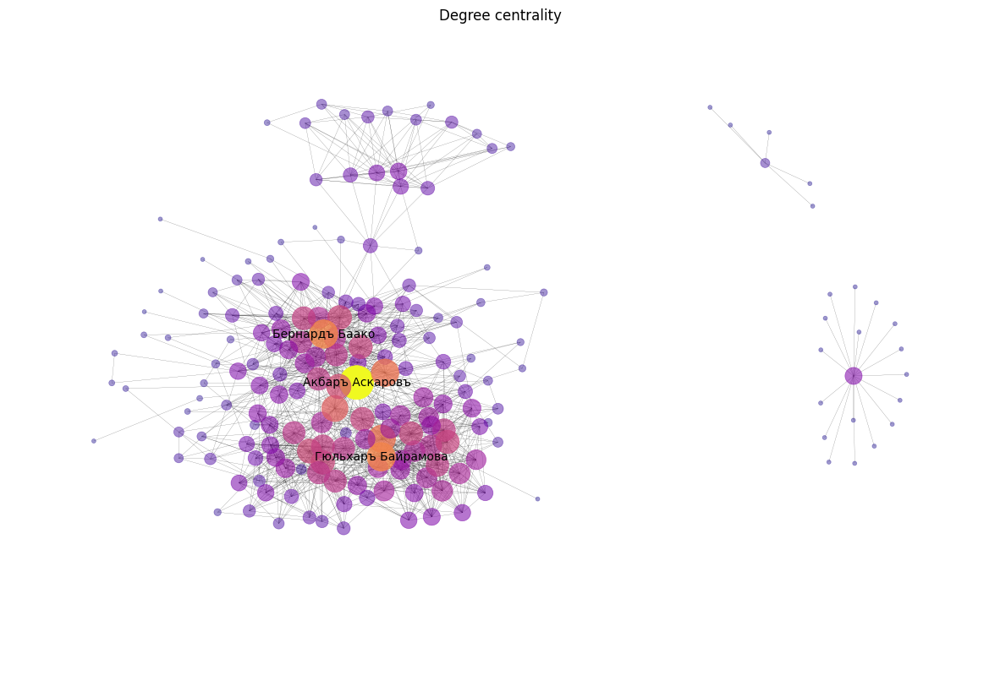

,id,name,sex,centrality
0,384121552,Акбаръ Аскаровъ,м,0.333333
1,389679990,Гюльхаръ Байрамова,ж,0.233831
2,458727779,Бернардъ Баако,м,0.233831
3,157632253,Андрей Габриэль,м,0.218905
4,559493650,Ботуръ Нажмидиновъ,м,0.218905
5,388859317,Daniel Suarez,м,0.199005
6,511066171,Barbara Majdakova,ж,0.174129
7,561252362,Ian Dalmau,м,0.169154
8,286802151,Миранъ Мирзохидовъ,м,0.164179
9,583298409,Кадыровъ Самиръ,м,0.164179


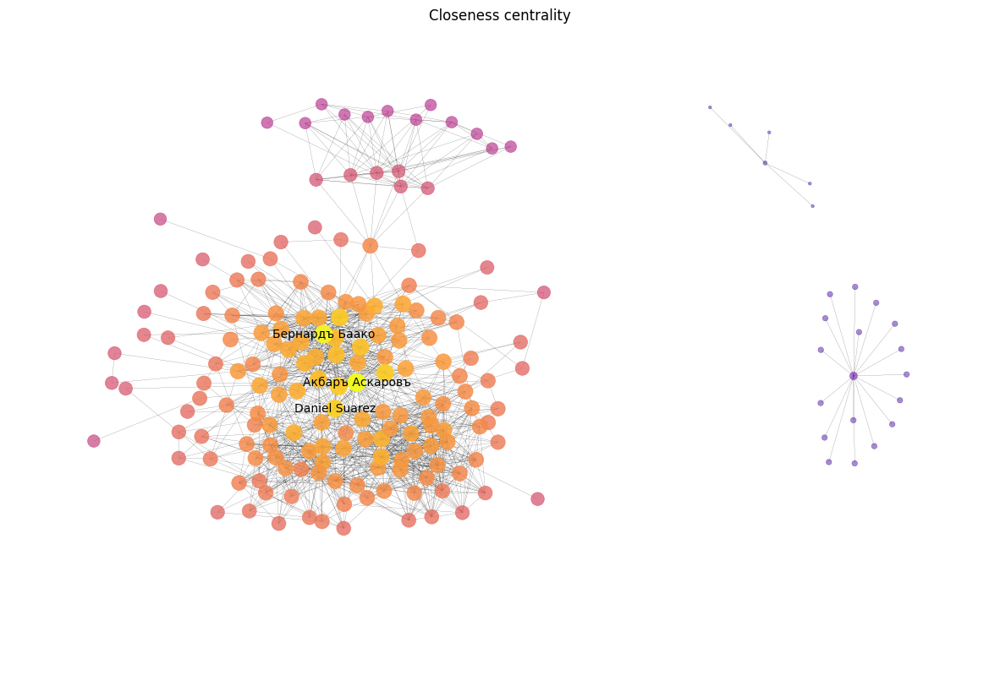

,id,name,sex,centrality
0,384121552,Акбаръ Аскаровъ,м,0.466822
1,458727779,Бернардъ Баако,м,0.459365
2,388859317,Daniel Suarez,м,0.421645
3,559493650,Ботуръ Нажмидиновъ,м,0.419187
4,286802151,Миранъ Мирзохидовъ,м,0.416757
5,511066171,Barbara Majdakova,ж,0.416757
6,310414504,Амаль Ганiевъ,м,0.405017
7,568430270,Zainab Hasan,ж,0.403879
8,444686887,Малика Аббасханова,ж,0.401623
9,40711575,Алексѣй Переясловъ,м,0.398286


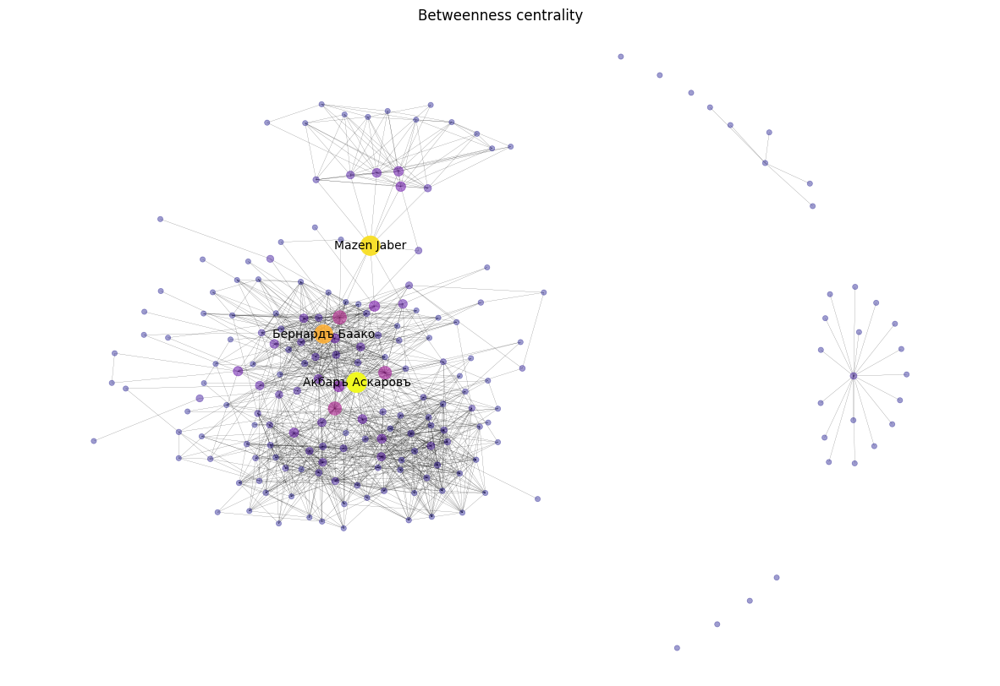

,id,name,sex,centrality
0,384121552,Акбаръ Аскаровъ,м,0.138151
1,319641859,Mazen Jaber,м,0.129584
2,458727779,Бернардъ Баако,м,0.113286
3,286802151,Миранъ Мирзохидовъ,м,0.056396
4,388859317,Daniel Suarez,м,0.054000
5,559493650,Ботуръ Нажмидиновъ,м,0.049733
6,511066171,Barbara Majdakova,ж,0.032668
7,443211933,Rodwane Badaoui,м,0.029902
8,266794567,Хасанъ Кобейсси,м,0.024784
9,149027647,Софико Меладзе,ж,0.023680


In [97]:
cases = [['degree', 2500, 0, 'Degree centrality'], 
         ['closeness', 500, 0, 'Closeness centrality'], 
         ['betweenness', 2000, 20, 'Betweenness centrality']]
my_cmap = customized_color('plasma', 0.4)
df = pos_layout(G)
pos = nx.kamada_kawai_layout(G, dist=df.to_dict())
for c_key, scale, bias, title in cases:
    label = top_name_center_dict[c_key]
    plt.figure(figsize=(15, 10))
    plt.title(title)
    nx.draw(G, 
            pos=pos,
            width=0.1,
            linewidths=0.5,
            cmap=my_cmap,
            node_size=c[c_key]*scale + bias,
            node_color=c[c_key])
    nx.draw_networkx_labels(G, pos=pos, labels=label, font_size=10)
    plt.show()
    display(top_dfs[c_key][:10])

Page-Rank/HITS in a case of directed network, top nodes description.

,id,name,centrality
0,Ahmad Al,Ahmad Al,0.042631
1,384121552,Акбаръ Аскаровъ,0.021010
2,458727779,Бернардъ Баако,0.015892
3,Ламъ Нгуенъ,Ламъ Нгуенъ,0.014483
4,559493650,Ботуръ Нажмидиновъ,0.013518


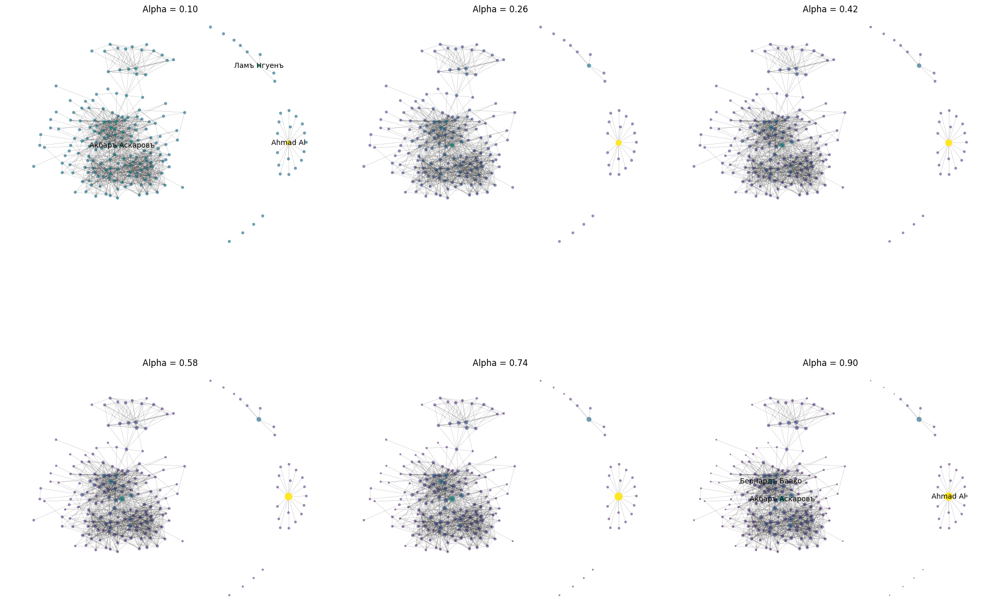

In [108]:
def top10_pagerank(G, alpha):
    top10_centralities_dict = {}      
    top10_deg_page = sorted(list(nx.pagerank(G, alpha).items()), key=lambda x:x[1], reverse=True)[:10]
    ids, centrality = zip(*top10_deg_page)
    names = [G.nodes[id]['label'] for id in ids]
#         relation = [G.nodes[id]['relation'] for id in ids]
    top10_centralities_dict = pd.DataFrame({'id': ids,'name':names, 'centrality': centrality})
    return top10_centralities_dict



cmap = customized_color('viridis', 0.45)
PR_alphas = np.arange(0.1, 1, 0.16)

df = pos_layout(G)
pos = nx.kamada_kawai_layout(G, dist=df.to_dict())

fig, axes = plt.subplots(2,3, figsize=(25,15))
fig.subplots_adjust(hspace = .5, wspace=.001)
axe = axes.ravel()

for alpha, i in zip(PR_alphas,np.arange(0,6)):
    top_dfs_pr = top10_pagerank(G, alpha)
    top_name_pr = top_dfs_pr[['name']][:3].set_index(top_dfs_pr['id'][:3]).to_dict()['name']
    PR = nx.pagerank(G, alpha)
    node_size = [pr*3e3 for node, pr in PR.items()]
    norm = plt.Normalize(0, max(PR.values()))
    node_colors = [cmap(norm(PR[node])) for node in G.nodes]


    axe[i].set_title('Alpha = {:.2f}'.format(alpha))
    nx.draw(G, 
            pos=pos,
            width=0.1,
            linewidths=0.5,
            node_size=node_size,
            node_color=node_colors,
            ax=axe[i]
            ) 
    if i in [0,5]:
      nx.draw_networkx_labels(G, 
                              pos=pos, 
                              labels=top_name_pr, 
                              font_size=10,
                              ax=axe[i])

display(top10_pagerank(G, 0.85)[:5])

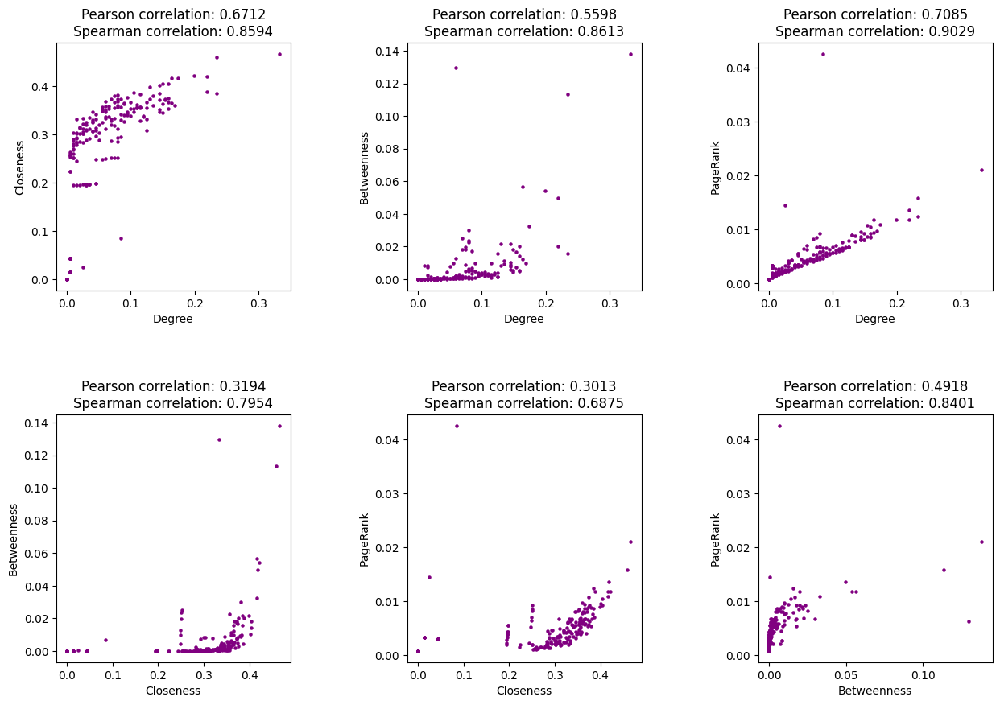

In [109]:
def pearson(a,b):
    return np.corrcoef(a, b)[0][1]
def spearman(a,b):
    return spearmanr(a, b)[0]

corrvals = [
    ('Degree', list(nx.degree_centrality(G).values())),
    ('Closeness', list(nx.closeness_centrality(G).values())),
    ('Betweenness', list(nx.betweenness_centrality(G).values())),
    ('PageRank', list(nx.pagerank(G).values()))
]

plt.figure(figsize=(3*5, 2*5))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
k = 1
for i in range(len(corrvals)):
    for j in range(i + 1, len(corrvals)):
        i_label, i_vals = corrvals[i]
        j_label, j_vals = corrvals[j]
        pcorrelation = pearson(i_vals, j_vals)
        scorrelation = spearman(i_vals, j_vals)
        plt.subplot(2, 3, k)
        plt.scatter(i_vals, j_vals, s=5, color='purple')
        plt.title('Pearson correlation: {:.4f}\nSpearman correlation: {:.4f}'.format(pcorrelation, scorrelation))
        plt.xlabel(i_label)
        plt.ylabel(j_label)
        k += 1

Assortative mixing by node attributes and node degree.

In [122]:
def atr_mapping(G, atr, threshold=2, only_names=True):
  mapping = {}
  atrs = nx.get_node_attributes(G, atr)
  occ_atr = [(v,occ) for v,occ in Counter(atrs.values()).most_common() if v != ''][:threshold]
  for (atr_val, occ), i in zip(occ_atr, range(0,len(occ_atr))):
    mapping[atr_val] = i
  return mapping

def atr_mixing(G, atr, threshold=2):
  mapping_for_plot = atr_mapping(G, atr, threshold)
  mapping_for_func = atr_mapping(G, atr, threshold, only_names=False)
  atrs = nx.get_node_attributes(G, atr)
  mixing = nx.attribute_mixing_matrix(G, atr, mapping=mapping_for_func)

  return mixing, mapping_for_plot

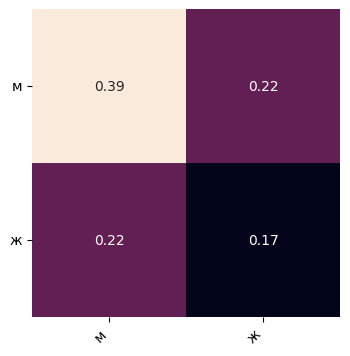

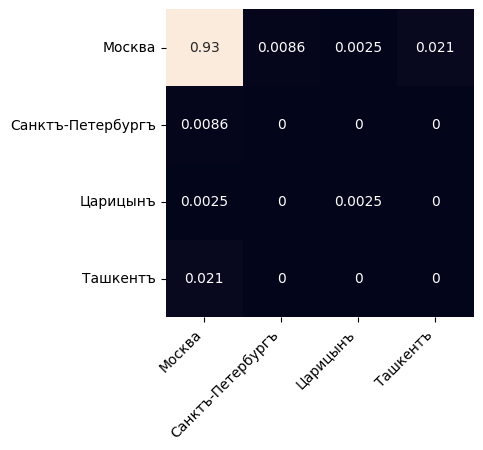

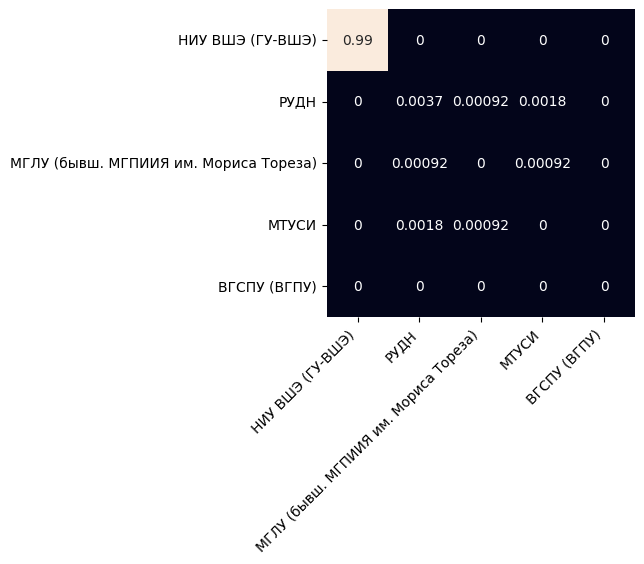

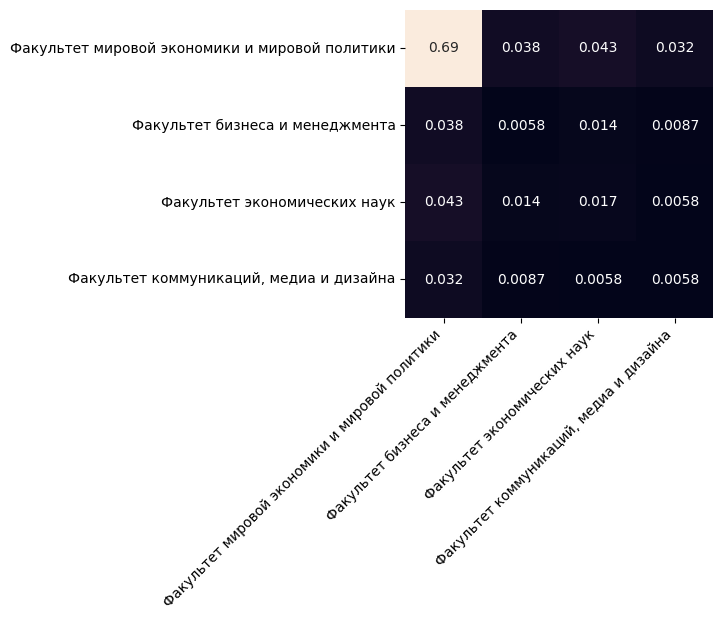

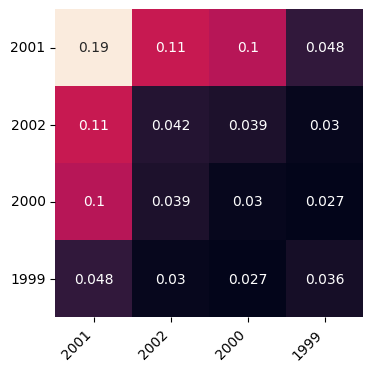

In [124]:
atrs = {'sex':2,
        'city':4, 
        'university_name':5, 
        'faculty_name': 4,
        'byear':4}

for k,v in atrs.items():
  fig = plt.figure(figsize=(4, 4))
  mixing, mapping = atr_mixing(gig_component, k, v)
  hmap = sns.heatmap(
      mixing,
      cbar=False,
      annot=True,
      square=True)
  hmap.set_xticklabels(
      labels=[k for k,_ in mapping.items()], 
      rotation=45, 
      horizontalalignment='right')
  hmap.set_yticklabels(
      labels=[k for k,_ in mapping.items()], 
      rotation=0)
  plt.show()

Node structural equivalence/similarity.

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


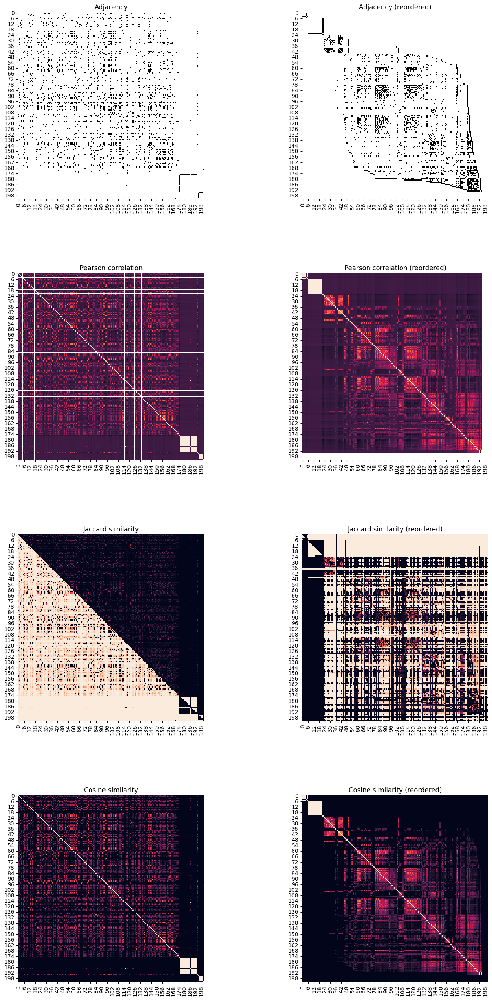

In [111]:
def sim_matrices(G):
  A = nx.to_numpy_array(G)
  pc = np.corrcoef(A)
  J = np.zeros(A.shape)
  for i, j, c in nx.jaccard_coefficient(nx.from_numpy_array(A)):
    J[i,j] = c 
    J[j,i] = 1-c 

  cs = cosine_similarity(A)
  
  return A, pc, J, cs

def cm_order(G):
  adj_matrix = nx.adjacency_matrix(G)

  return reverse_cuthill_mckee(adj_matrix)



A, corr, J, cos = sim_matrices(G)
order = cm_order(G)

fig = plt.figure(figsize=(16, 16*2))
plt.subplots_adjust(hspace=0.4, wspace=0.4)

cases = [[1, A, plt.cm.Greys, 'Adjacency', range(len(nx.degree(G)))],
         [2, A, plt.cm.Greys, 'Adjacency (reordered)', order],
         [3, corr, None, 'Pearson correlation', range(len(nx.degree(G)))], 
         [4, corr, None, 'Pearson correlation (reordered)', order], 
         [5, J, None, 'Jaccard similarity', range(len(nx.degree(G)))], 
         [6, J, None, 'Jaccard similarity (reordered)', order], 
         [7, cos, None, 'Cosine similarity', range(len(nx.degree(G)))], 
         [8, cos, None, 'Cosine similarity (reordered)', order]]

for i, matrix, cmap, t, o in cases:
    plt.subplot(4, 2, i)
    hmap = sns.heatmap(
        matrix[np.ix_(o, o)],
        cmap=cmap,
        cbar=False,
        square=True)
    plt.title(t)

# Community Detection

*   Clique search, k-cores visualization.
*   Best results of various community detection algorithms, both in terms of interpretation and some quality criterion (modularity, silhouette, ground truth partition).

*   The results should be visible on the network layout.






Clique search, k-cores visualization.

In [112]:
cliques = list(nx.find_cliques(G))
print("Number of Cliques :", len(cliques))
print("Average clique size", sum([len(clique)/len(cliques) for clique in cliques]))

Number of Cliques : 693
Average clique size 5.669552669552656


In [113]:
def largest_cliques(G):
    color = [random.random(), random.random(), random.random()]
    clique_list = list(nx.find_cliques(G))
    max_clique_length = max([len(i) for i in clique_list])
    largest_cliques = [i for i in clique_list if len(i) == max_clique_length]
    nodes_largest_cliques = list(set([j for i in largest_cliques for j in i]))
    rgb0, rgb1 = [], []
    width1, width2 = [], []
    for node in G.nodes:
        if node in largest_cliques[0]:
            rgb0.append(color)
        else:
            rgb0.append((1, 1, 1))
    for node in G.nodes:    
        if node in largest_cliques[1]:
            rgb1.append(color)
        else:
            rgb1.append((1, 1, 1))
            
    rgb = np.array([rgb0, rgb1])
    
    for edge1, edge2 in G.edges:
        if edge1 in largest_cliques[0] and edge2 in largest_cliques[0]:
            width1.append(2)
        else:
            width1.append(1)
    for edge1, edge2 in G.edges:
        if edge1 in largest_cliques[1] and edge2 in largest_cliques[1]:
            width2.append(2)
        else:
            width2.append(1)
    width = np.array([width1, width2])
    
    return largest_cliques, rgb, width

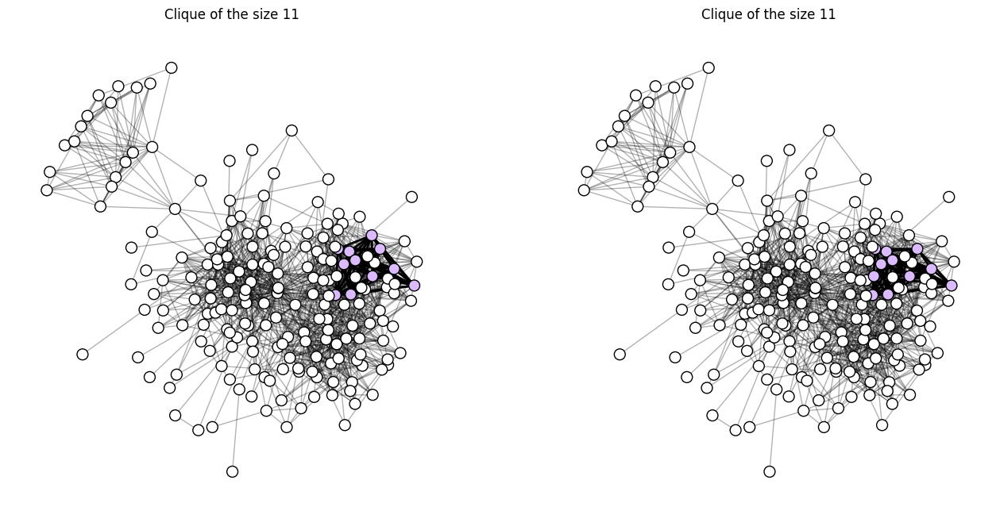

In [114]:
max_cliques, colors, widths = largest_cliques(G)

size = np.unique(colors[0], axis=0, return_counts=True)[1][0]
pos = nx.kamada_kawai_layout(G)
plt.figure(figsize=(8*2, 8))

for i in range(colors.shape[0]):
    
    b_edges = np.array(list(G.edges))[widths[i] == widths[i].max()]
    
    plt.subplot(1, 2, i+1)
    nodes = nx.draw_networkx_nodes(
        G, 
        pos,
        node_color=colors[i], 
        node_size=100, 
        linewidths=1, 
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        G,
        pos,
        alpha=0.3,
        width=widths[i].min()
    )
    nx.draw_networkx_edges(
        G,
        pos,
        width=widths[i].max(),
        edgelist=b_edges
    )
    plt.title('Clique of the size {}'.format(size))
    plt.axis('off')

In [115]:
def customized_color(name_cmap, alpha):
  cmap = plt.get_cmap(name_cmap)
  custom_cmap = cmap(np.arange(cmap.N))
  custom_cmap[:,-1] = np.linspace(alpha, 1, cmap.N)
  custom_cmap = ListedColormap(custom_cmap)
  return custom_cmap

def pos_layout(g):
  df = pd.DataFrame(index=g.nodes(), columns=g.nodes())
  for row, data in nx.shortest_path_length(g):
      for col, dist in data.items():
          df.loc[row,col] = dist

  df = df.fillna(df.max().max())
  return df
df_g = pos_layout(G)
pos = nx.kamada_kawai_layout(G, dist=df_g.to_dict())

In [116]:
def k_core_decompose(G):
    return np.array(list(nx.core_number(G).values()))

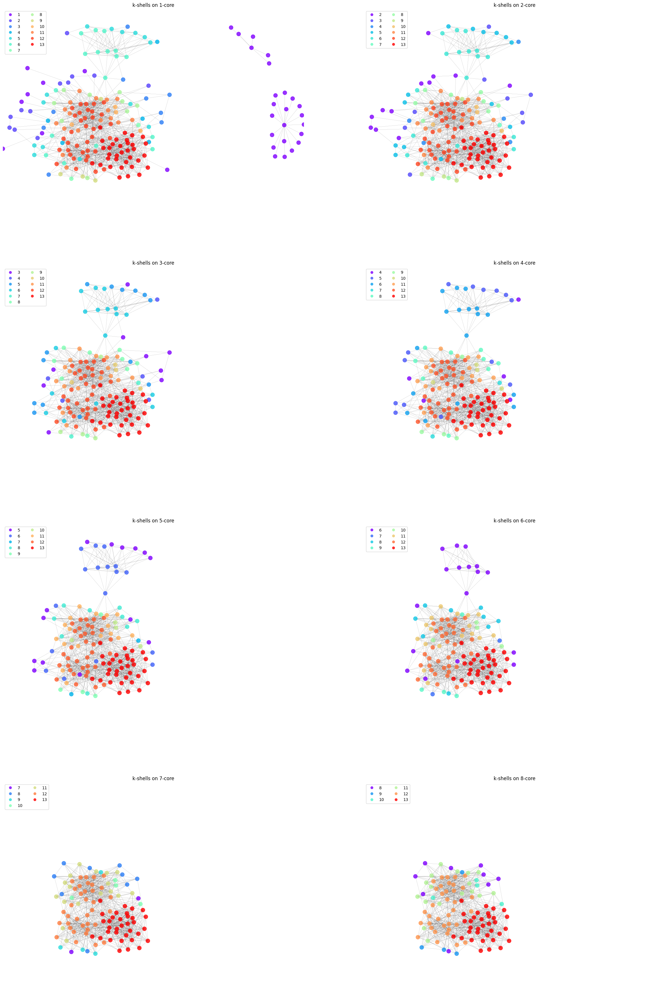

In [117]:
my_cmap = customized_color('plasma', 0.4)
plt.figure(figsize=(30, 45))

x_max, y_max = np.array(list(pos.values())).max(axis=0)
x_min, y_min = np.array(list(pos.values())).min(axis=0)

for i in range(8):
    plt.subplot(4, 2, i+1)
    subG = nx.k_core(G, i+1)
    nodes = nx.draw_networkx_nodes(
        subG, 
        pos=pos,
        cmap=plt.get_cmap('rainbow'),
        node_color=k_core_decompose(subG), 
        node_size=100,
        alpha=0.8
    )
    nx.draw_networkx_edges(
        subG, 
        pos=pos,
        width=0.1
    )
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)
    plt.legend(*nodes.legend_elements(), loc="upper left", ncol=len(nodes.legend_elements()))
    plt.axis('off')
    plt.title('k-shells on {}-core'.format(i+1))

Modularity

In [125]:
def edge_betw_modularity(G, n):
    res = []
    comm_gen = nx.algorithms.community.girvan_newman(G)
    for i in range(n):
        part = next(comm_gen)
        res.append(nx.algorithms.community.modularity(G, part))
    return np.array(res)

n_iterations = 20
modularity = edge_betw_modularity(G, n_iterations)

<ipython-input-131-ce290ccebc28>:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot(


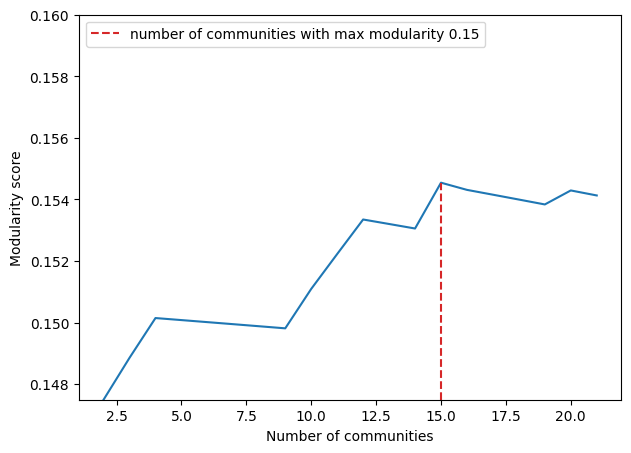

In [131]:
plt.figure(figsize=(7, 5))
plt.plot(np.arange(n_iterations)+2, modularity)
best_n = np.argmax(modularity) + 2
label = 'number of communities with max modularity {:.2f}'.format(max(modularity))
plt.plot(
    [best_n, best_n], [min(modularity), max(modularity)], 
    'k--', c='tab:red', 
    label=label
)
plt.ylabel('Modularity score')
plt.xlabel('Number of communities')
plt.legend(loc='upper left')
plt.ylim((modularity.min(), 0.16))
plt.show()

In [132]:
def edge_betweenness(G, n):
    Gcopy = G.copy()
    curr_cc_count = nx.number_connected_components(Gcopy)
    result = []
    while curr_cc_count <= n:
        edge_btw = nx.edge_betweenness_centrality(Gcopy)
        cut_edge = sorted(edge_btw.keys(), key=lambda x: edge_btw[x])[-1]
        Gcopy.remove_edge(*cut_edge)
        if nx.number_connected_components(Gcopy) > curr_cc_count:
            iter_result = np.zeros((Gcopy.number_of_nodes()))
            for idx, cc in enumerate(nx.connected_components(Gcopy)):
                iter_result[np.isin(G.nodes, list(cc))] = idx
            result.append(iter_result)
            curr_cc_count += 1
    return np.array(result)

labels = edge_betweenness(G, 6)
     

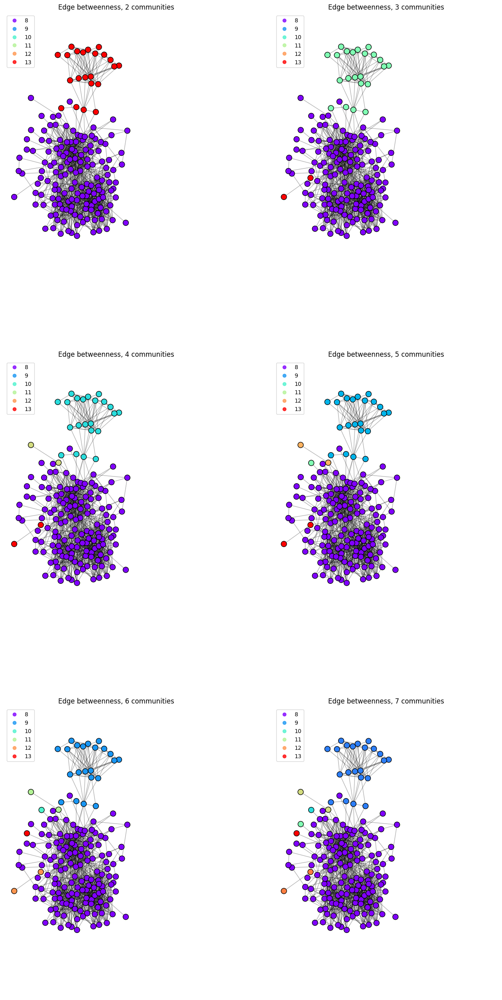

In [133]:
plt.figure(figsize=(8*2, 8*4))
colors = edge_betweenness(gig_component, 6)
for i in range(colors.shape[0]):
    plt.subplot(3, 2, i+1)
    nx.draw_networkx_nodes(
        gig_component, 
        pos,
        cmap=plt.cm.rainbow,
        node_color=colors[i], 
        node_size=100, 
        edgecolors='black'
    )
    nx.draw_networkx_edges(gig_component, pos, alpha=0.3)
    
    eps = (x_max - x_min) * 0.05
    plt.xlim(x_min-eps, x_max+eps)
    plt.ylim(y_min-eps, y_max+eps)
    plt.legend(*nodes.legend_elements(), loc="upper left")
    plt.axis('off')
    plt.title('Edge betweenness, {} communities'.format(i+2))

Laplacian Eigenmaps

In [7]:
def norm_laplacian(A):
    node_degrees = np.array(A.sum(axis=1))
    D = node_degrees**-0.5
    D_prime = np.diag(D)
    L = np.matmul(np.matmul(D_prime, (np.diag(node_degrees)-A)), D_prime)
    vals, vecs = np.linalg.eigh(L)
    pos = np.argsort(vals)
    vecs = vecs[:, pos]
    vals = vals[pos]
    for i in range(len(node_degrees)):
        vecs[i] /= np.sqrt(1/node_degrees[i])
    
    laplacian_eigenmaps = vecs[:, 1:]
    k_means = KMeans(len(node_degrees)).fit(laplacian_eigenmaps)
    
    return L, k_means.labels_


def spectral_embedding(L, degree_seq, n_components):
    vals, vecs = np.linalg.eigh(L)
    pos = np.argsort(vals)
    vecs = vecs[:, pos]
    vals = vals[pos]
    return vecs[:, 1: n_components+1]


def spectral_clustering(G, n_clusters, n_components):
    A = nx.to_numpy_array(G)
    L, degree_seq = norm_laplacian(A)
    embedding = spectral_embedding(L, degree_seq, n_components)
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(embedding)
    return kmeans.labels_

In [8]:
plt.figure(figsize=(8, 8))
nodes = nx.draw_networkx_nodes(
    gig_component, 
    pos,
    cmap=plt.cm.rainbow,
    node_color=spectral_clustering(gig_component, 6, 5), 
    node_size=100, 
    linewidths=1, 
    edgecolors='black'
)
nx.draw_networkx_edges(
    gig_component,
    pos,
    alpha=0.2,
    edge_color='black'
)
plt.axis('off')
plt.legend(*nodes.legend_elements(), loc="upper left")
plt.title('Spectral Clustering')
plt.show()

NameError: ignored

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


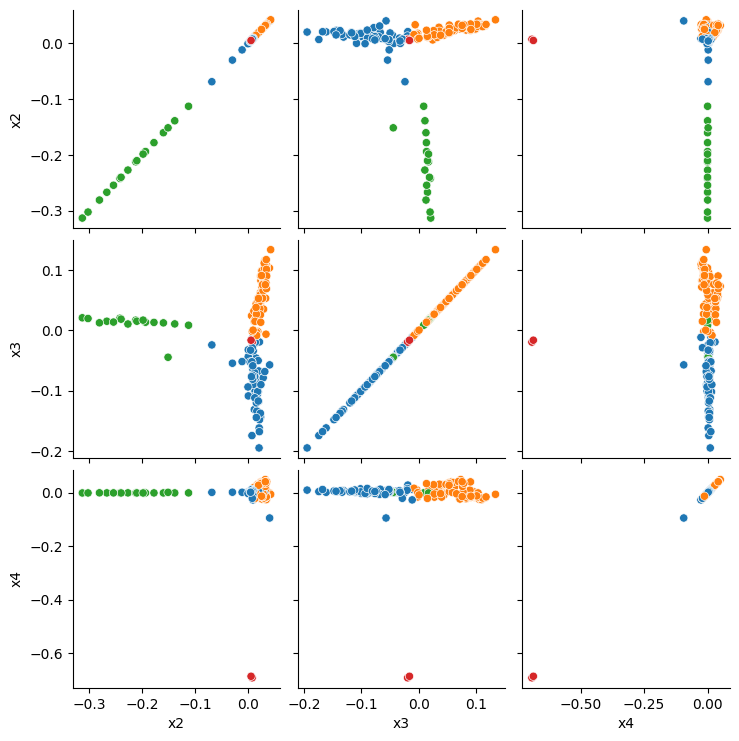

In [136]:
A = nx.to_numpy_array(gig_component)
L, degree_seq = norm_laplacian(A)

embedding = spectral_embedding(L, degree_seq, 3)
labels = spectral_clustering(gig_component, 4, 3)
pair_data = pd.DataFrame(
    np.hstack([embedding, labels[:, None]]), 
    columns=['x2', 'x3', 'x4', 'label'])
pair_data.label = pair_data.label.astype('str')
p = sns.pairplot(
    pair_data,
    hue='label',
    diag_kind=None
)
p._legend.remove()
plt.show()
     

In [2]:
def simrank(G, r=0.8, max_iter=100, eps=1e-4):

    nodes = G.nodes()
    nodes_i = {k: v for(k, v) in [(nodes[i], i) for i in range(0, len(nodes))]}

    sim_prev = np.zeros(len(nodes))
    sim = np.identity(len(nodes))

    for i in range(max_iter):
        if np.allclose(sim, sim_prev, atol=eps):
            break
        sim_prev = np.copy(sim)
        for u, v in itertools.product(nodes, nodes):
            if u is v:
                continue
            u_ns, v_ns = G.predecessors(u), G.predecessors(v)

            # evaluating the similarity of current iteration nodes pair
            if len(u_ns) == 0 or len(v_ns) == 0: 
                # if a node has no predecessors then setting similarity to zero
                sim[nodes_i[u]][nodes_i[v]] = 0
            else:                    
                s_uv = sum([sim_prev[nodes_i[u_n]][nodes_i[v_n]] for u_n, v_n in itertools.product(u_ns, v_ns)])
                sim[nodes_i[u]][nodes_i[v]] = (r * s_uv) / (len(u_ns) * len(v_ns))


    return sim

In [3]:
def simrank_distance(G):
    return np.around(1 - simrank(G), decimals = 7)



def agglomerative_clustering(distance, max_distance):
    clusters = AgglomerativeClustering(n_clusters=None,
                                       affinity='precomputed',
                                       compute_full_tree=True,
                                       linkage='complete', 
                                       distance_threshold=max_distance)
    clusters.fit(distance)
    return clusters.labels_

In [5]:
distance = simrank_distance(gig_component)
labels = agglomerative_clustering(distance, 0.87)
plt.figure(figsize=(8, 8))
nx.draw_networkx_nodes(
    gig_component, 
    pos,
    cmap=plt.cm.rainbow,
    node_color=labels, 
    node_size=100, 
    linewidths=1, 
    edgecolors='black'
)
nx.draw_networkx_edges(
    gig_component,
    pos,
    alpha=0.2,
    edge_color='black'
)
plt.legend(*nodes.legend_elements(), loc="upper left")
plt.title('Agglomerative Clustering')
plt.axis('off')
plt.show()

NameError: ignored